In [58]:
from gliomi import *

In [59]:
repo = SequenceRepoGliomi("/data/RMN/dataset-gliomi")

In [87]:
img = repo.get_sequence("GATTAMORTA_NATALINA", "T1")

In [88]:
data = img.get_fdata()

In [89]:
import numpy as np

np.min(data), np.max(data)

(0.19342264533042908, 191.93115234375)

In [90]:
data.shape

(192, 256, 144)

In [91]:
def draw_text(ax, text):
    from matplotlib.offsetbox import AnchoredText
    at = AnchoredText(text,
                      loc=2, prop=dict(size=32), frameon=True,
                      )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    ax.add_artist(at)

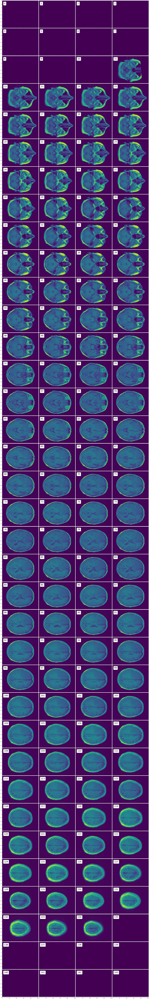

In [92]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(40., (int(data.shape[2] / 4) + 1) * 10.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(int(data.shape[2] / 4) + 1, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )


for ax, (subject, im) in zip(grid, [(i, data[:,:,i]) for i in range(data.shape[2])]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)
    draw_text(ax, subject)
    # ax.imshow(im_roi, alpha=0.5)

plt.show()

# Plot Slice with Tumor

t1 (192, 256, 144)
roi (360, 512, 20)
roi resampled (192, 256, 144)


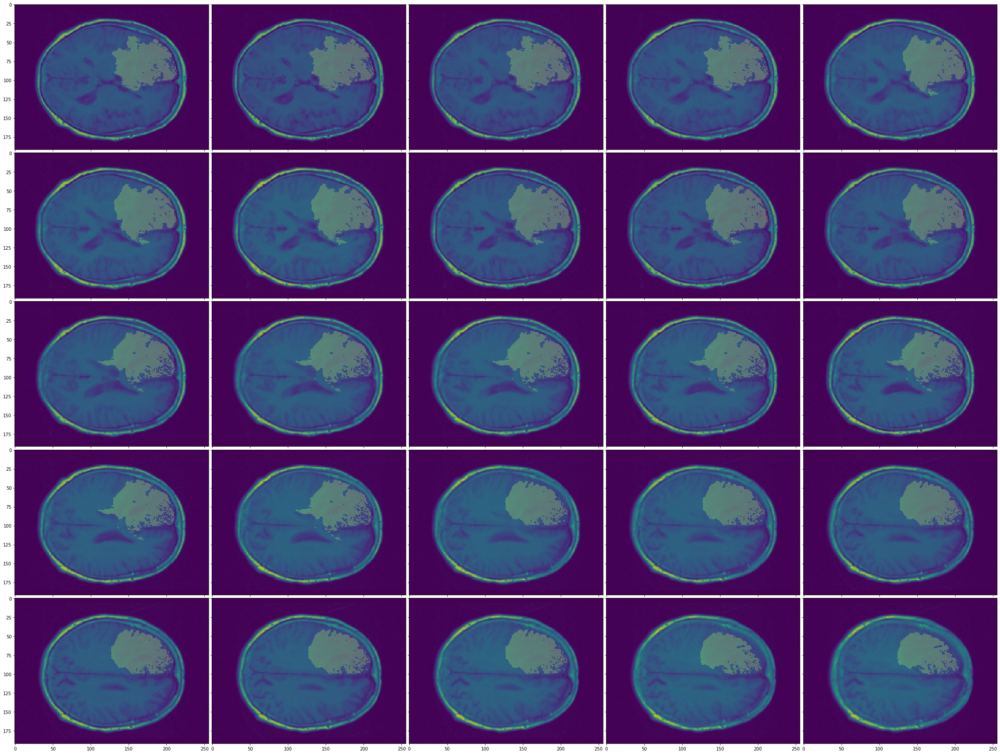

In [93]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from nilearn.image import resample_to_img

subjects_dir = "/data/RMN/dataset-gliomi"

subject = "GATTAMORTA_NATALINA"

sequence_repo = SequenceRepoGliomi(subjects_dir)

t1 = sequence_repo.get_sequence(subject, "T1")

print("t1", t1.shape)

roi = sequence_repo.get_roi(subject, "T2ROI")

print("roi", roi.shape)

roi_resampled = resample_to_img(roi, t1, interpolation='nearest')

print("roi resampled", roi_resampled.shape)

img = t1.dataobj

img_roi = roi_resampled.dataobj

fig = plt.figure(figsize=(40., 40.))

grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

((rmin, rmax), (cmin, cmax), (zmin, zmax)) = get_bounding_box(roi_resampled)

zcenter = int((zmax - zmin) / 2) + zmin

indexes = list(range(zcenter - 13, zcenter + 13))

for ax, im, im_roi in zip(grid, [img[:,:,z_slice] for z_slice in indexes], [img_roi[:,:,z_slice] for z_slice in indexes]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)
    ax.imshow(im_roi, alpha=0.2)

plt.show()

t1 (192, 256, 160)
roi (192, 256, 160)
roi resampled (192, 256, 160)


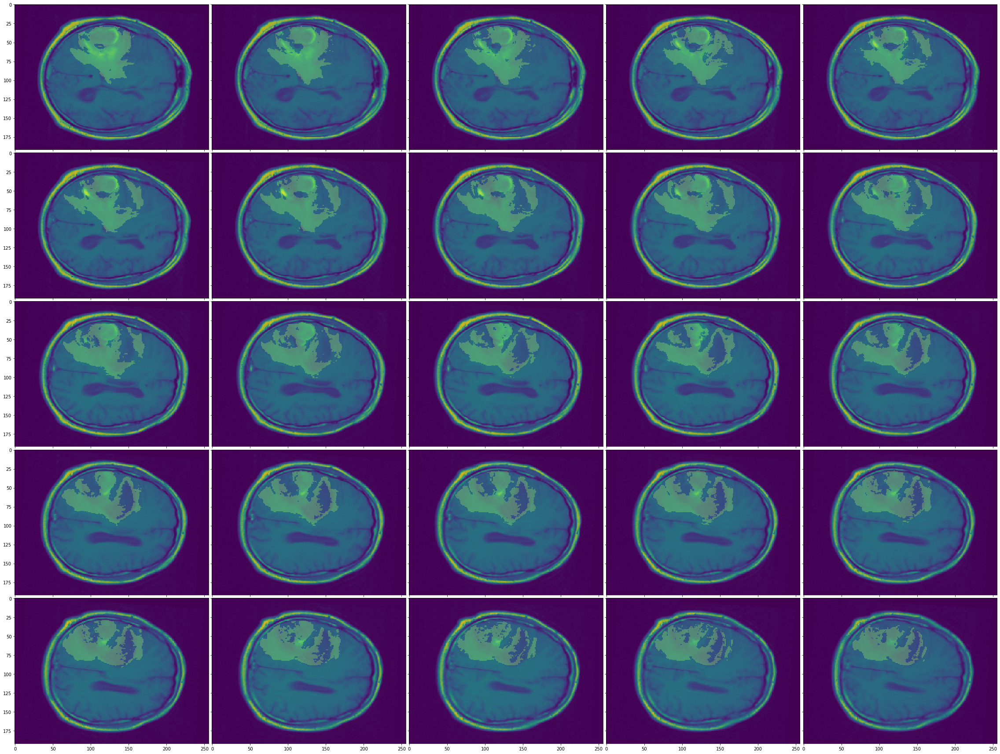

In [67]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
from nilearn.image import resample_to_img

subjects_dir = "/data/RMN/dataset-gliomi"

subject = "ZEPPA_ONORIO"

sequence_repo = SequenceRepoGliomi(subjects_dir)

t1 = sequence_repo.get_sequence(subject, "T1")

print("t1", t1.shape)

roi = sequence_repo.get_roi(subject, "T2ROI")

print("roi", roi.shape)

roi_resampled = resample_to_img(roi, t1, interpolation='nearest')

print("roi resampled", roi_resampled.shape)

img = t1.dataobj

img_roi = roi_resampled.dataobj

fig = plt.figure(figsize=(40., 40.))

grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

((rmin, rmax), (cmin, cmax), (zmin, zmax)) = get_bounding_box(roi_resampled)

zcenter = int((zmax - zmin) / 2) + zmin

indexes = list(range(zcenter - 13, zcenter + 13))

for ax, im, im_roi in zip(grid, [img[:,:,z_slice] for z_slice in indexes], [img_roi[:,:,z_slice] for z_slice in indexes]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)
    ax.imshow(im_roi, alpha=0.2)

plt.show()

In [79]:
## import pickle

"""
Load a set of slices given the ROI sizes and the selected percentile for a single subject.
Only slices with a ROI size greater or equal that corresponding percentile are considered.
"""
def load_data_single_channel_for_subject(subjects_dir, subject, sequence_name, side, percentile):
    
    # Load sizes
    with open(f"{subjects_dir}/../roi-sizes/roi-sizes-{subject}-{side}.pickle", "rb") as file:
        roi_sizes = pickle.load(file)
    
    # Load slices
    with open(f"{subjects_dir}/{subject}/slices-{sequence_name}-{side}.pickle", "rb") as file:
        slices = pickle.load(file)
        
    print(roi_sizes)
        
    return slices[:,:,ordered_index_percentile_of_sizes(roi_sizes, percentile)]

In [80]:
"""
Load a set of slices given the ROI sizes and the selected percentile for a set of subjects.
Only slices with a ROI size greater or equal that corresponding percentile are considered.
Images channels correspondes to specified sequences given in the same order.
"""
def load_data(subjects_dir, subjects, sequence_names, side, percentile):
    slices = [
        np.stack([
            load_data_single_channel_for_subject(subjects_dir, subject, sequence_name, side, percentile) 
            for sequence_name in sequence_names], axis=3)
        for subject in subjects
    ]
    return np.moveaxis(np.concatenate(slices, axis=2), 2, 0)

In [83]:
images = load_data("/data/RMN/dataset-gliomi-cnn/slices-full-brain", ["IONTA_LUCIANA"], ["T1"], 224, 100)

[ 9576.  9576.  9576.  9576.  9576.  9576.  9576.  9576.  9576.  9576.
  9576.  9576.  9576.  9576.  9576.  9576.  9576.  9576.  9576. 17458.
 17458. 17458. 17458. 17458. 17458. 17458. 17458. 17458. 17458. 17458.
 17458. 17458. 17458. 17458. 17458. 17458. 17500. 17500. 17500. 17500.
 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835.
 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835. 19835.
 19835. 19835. 26033. 26033. 26033. 26033. 26033. 26033. 26033. 26033.
 26033. 26033. 26033. 26033. 26033. 26033. 26033. 26033. 28930. 28930.
 28930. 28930. 28930. 28930. 28930. 28930. 28930. 28930. 28930. 28930.
 28930. 28930. 28930. 28930. 28930. 28930. 28930. 28930. 28930. 26340.
 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340.
 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340. 26340.
 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775.
 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775. 12775.
 12775

In [84]:
images.shape

(21, 224, 224, 1)

In [85]:
data = images[:,:,:,0]

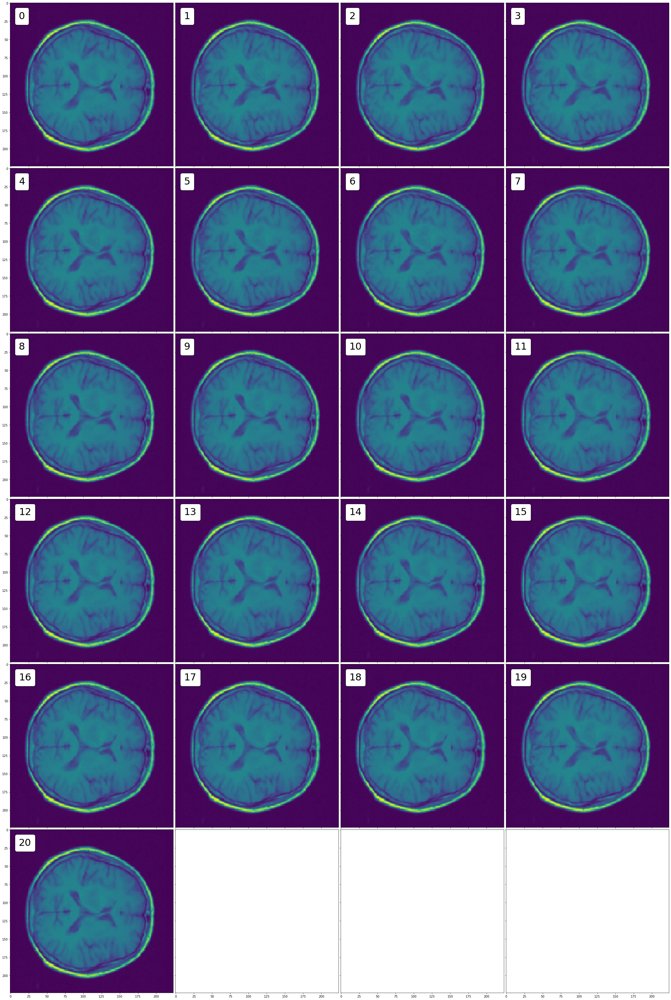

In [86]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(40., (int(data.shape[0] / 4) + 1) * 10.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(int(data.shape[0] / 4) + 1, 4),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )


for ax, (subject, im) in zip(grid, [(i, data[i,:,:]) for i in range(data.shape[0])]):
    # Iterating over the grid returns the Axes.
    ax.imshow(im)
    draw_text(ax, subject)
    # ax.imshow(im_roi, alpha=0.5)

plt.show()